In [1]:
import pandas as pd

data = pd.read_csv('data_sample_three_years.csv')

data = data.iloc[:, [0,2,3,4]]
data.rename(columns={'low':'close', 'open':'high', 'high':'low'}, inplace=True)

from talib import RSI
data['rsi'] = RSI(data['close'])

In [2]:
from talib import MA, SMA, EMA

In [3]:
data['ma'] = MA(data['close'])
#data['sma'] = SMA(data['close'])
#data['ema'] = EMA(data['close'])

In [4]:
import matplotlib.pyplot as plt

plt.figure(figsize=(300, 48))

plt.plot(data['close'])
plt.plot(data['ma'])
#plt.plot(data['sma'])
#plt.plot(data['ema'])
plt.show()

In [5]:
data.dropna(axis=0, inplace=True)

## Pure classifier

In [6]:
data['ma>'] = data['ma'] > data['close'] # under the MA line
data['ma<'] = data['ma'] < data['close'] # above the MA line

In [7]:
data['close_shifted'] = data['close'].shift(5)

In [8]:
data.dropna(axis=0, inplace=True)

In [9]:
data['up'] = data['close'] > data['close_shifted']
data['down'] = data['close'] < data['close_shifted']

In [10]:
import numpy as np

data['target'] = np.where(data['ma>'] & data['down'], 1, np.where(data['ma<'] & data['up'], -1, 0))

In [11]:
data

,timestamp,high,low,close,rsi,ma,ma>,ma<,close_shifted,up,down,target
34,1612904400,1775.99,1761.11,1770.48,61.295778,1734.384667,False,True,1760.23,True,False,-1
35,1612908000,1770.49,1753.33,1767.11,60.434779,1737.820667,False,True,1751.09,True,False,-1
36,1612911600,1779.99,1749.09,1770.79,61.077723,1739.071000,False,True,1736.78,True,False,-1
37,1612918800,1811.00,1783.08,1809.37,67.111654,1743.087667,False,True,1744.33,True,False,-1
38,1612922400,1832.40,1801.00,1814.81,67.868069,1746.396000,False,True,1754.75,True,False,-1
...,...,...,...,...,...,...,...,...,...,...,...,...
24354,1707336000,2445.00,2418.66,2438.64,79.375495,2374.780000,False,True,2368.69,True,False,-1
24355,1707339600,2439.27,2424.86,2429.71,73.149791,2377.675333,False,True,2397.03,True,False,-1
24356,1707343200,2431.16,2421.03,2424.75,69.871719,2380.293333,False,True,2409.59,True,False,-1
24357,1707346800,2429.61,2421.81,2424.22,69.513250,2382.667333,False,True,2416.97,True,False,-1


In [12]:
inputs = data.iloc[:, [6,7,9,10]]
target = data.iloc[:, [11]]

In [13]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.metrics import mean_squared_error, accuracy_score

In [14]:
X_train, X_test, y_train, y_test = train_test_split(inputs, target, test_size=0.2, random_state=1, shuffle=False)

In [15]:
classifier = DecisionTreeClassifier(random_state=1)
classifier.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

In [16]:
pred = classifier.predict(X_test)

In [17]:
y_test['pred'] = pred

In [18]:
y_test

,target,pred
19494,0,0
19495,-1,-1
19496,-1,-1
19497,-1,-1
19498,-1,-1
...,...,...
24354,-1,-1
24355,-1,-1
24356,-1,-1
24357,-1,-1


In [19]:
accuracy_score(y_test['target'], pred)

1.0

In [20]:
import matplotlib.pyplot as plt
from sklearn import tree

plt.figure(figsize=(300, 48))

tree.plot_tree(classifier)
plt.show()

## trying regressors

In [21]:
import pandas as pd

data2 = pd.read_csv('data_sample_three_years.csv')

data2 = data2.iloc[:, [0,2,3,4]]
data2.rename(columns={'low':'close', 'open':'high', 'high':'low'}, inplace=True)

from talib import RSI
from talib import MA, SMA, EMA

data2['rsi'] = RSI(data2['close'])
data2['ma'] = MA(data2['close'])

In [22]:
data2['close_shifted'] = data2['close'].shift(1)
data2['ma_shifted'] = data2['ma'].shift(1)

In [23]:
data2.dropna(axis=0, inplace=True)

In [24]:
data2.head(10)

,timestamp,high,low,close,rsi,ma,close_shifted,ma_shifted
30,1612882800,1761.00,1743.88,1751.09,58.774198,1715.234333,1760.23,1710.117667
31,1612886400,1765.00,1721.93,1736.78,55.752107,1720.006667,1751.09,1715.234333
32,1612890000,1751.13,1734.10,1744.33,57.008134,1725.372667,1736.78,1720.006667
33,1612893600,1761.43,1739.39,1754.75,58.748543,1729.864333,1744.33,1725.372667
34,1612904400,1775.99,1761.11,1770.48,61.295778,1734.384667,1754.75,1729.864333
35,1612908000,1770.49,1753.33,1767.11,60.434779,1737.820667,1770.48,1734.384667
36,1612911600,1779.99,1749.09,1770.79,61.077723,1739.071000,1767.11,1737.820667
37,1612918800,1811.00,1783.08,1809.37,67.111654,1743.087667,1770.79,1739.071000
38,1612922400,1832.40,1801.00,1814.81,67.868069,1746.396000,1809.37,1743.087667
39,1612926000,1830.00,1802.98,1815.08,67.907521,1748.972667,1814.81,1746.396000


In [25]:
import matplotlib.pyplot as plt

plt.figure(figsize=(200, 48))

plt.plot(data2['close'], color='black')
plt.plot(data2['close_shifted'], color='black')
plt.plot(data2['ma'], color='red')
plt.plot(data2['ma_shifted'], color='red')
plt.show()

In [26]:
data2['target'] = np.where(data2['close_shifted'] > data2['ma_shifted'], 1, -1)

In [27]:
inputs2 = data2.iloc[:, [3,5]]
target2 = data2.iloc[:, [8]]

In [28]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.metrics import mean_squared_error, accuracy_score

In [29]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(inputs2, target2, test_size=0.2, random_state=1, shuffle=False)

In [30]:
regressor = DecisionTreeRegressor(random_state=1)
regressor.fit(X_train2, y_train2)

DecisionTreeRegressor(random_state=1)

In [31]:
pred2 = regressor.predict(X_test2)
y_test2['pred'] = pred2

In [32]:
accuracy_score(y_test2['target'], pred2)

0.7519523222359227

In [33]:
#import matplotlib.pyplot as plt
#from sklearn import tree

#plt.figure(figsize=(300, 48))

#tree.plot_tree(regressor)
#plt.show()

In [34]:
y_test2.to_excel('MA-price-1bar.xlsx')

## chaining regressors

## alternative combination of factors

In [43]:
import pandas as pd

data3 = pd.read_csv('data_sample_three_years.csv')

data3 = data3.iloc[:, [0,2,3,4,5]]
data3.rename(columns={'low':'close', 'open':'high', 'high':'low', 'close':'volume'}, inplace=True)

from talib import RSI
from talib import MA, SMA, EMA

data3['rsi'] = RSI(data3['close'])
data3['ma'] = MA(data3['close'])

In [44]:
data3

,timestamp,high,low,close,volume,rsi,ma
0,1612742400,1632.73,1591.17,1597.59,150881.475,NaN,NaN
1,1612746000,1605.32,1580.00,1593.61,126587.969,NaN,NaN
2,1612753200,1592.00,1566.22,1583.35,98898.367,NaN,NaN
3,1612756800,1622.00,1579.60,1620.00,118243.825,NaN,NaN
4,1612771200,1653.40,1627.11,1634.87,111824.252,NaN,NaN
...,...,...,...,...,...,...,...
24354,1707336000,2445.00,2418.66,2438.64,202516.862,79.375495,2374.780000
24355,1707339600,2439.27,2424.86,2429.71,90509.200,73.149791,2377.675333
24356,1707343200,2431.16,2421.03,2424.75,46900.360,69.871719,2380.293333
24357,1707346800,2429.61,2421.81,2424.22,45636.371,69.513250,2382.667333


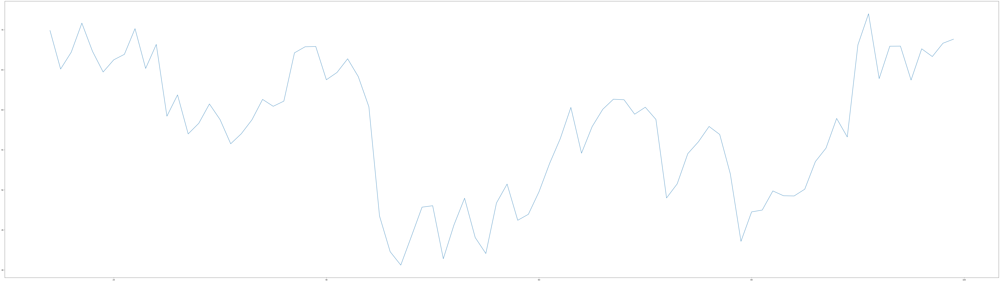

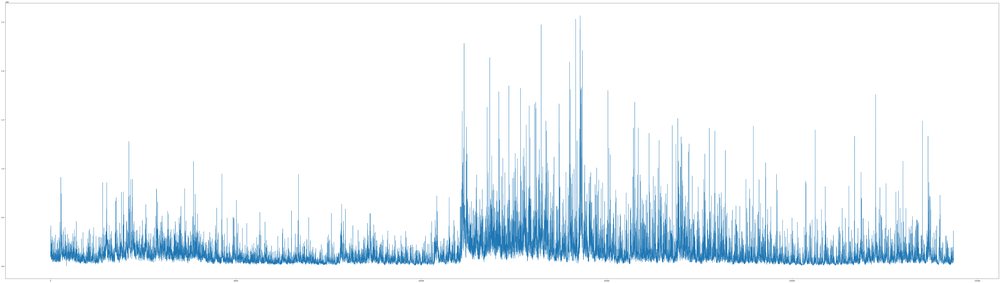

In [47]:
import matplotlib.pyplot as plt

plt.figure(figsize=(200, 48))

plt.plot(data3['high'].iloc[:100], color='green')
plt.plot(data3['low'].iloc[:100], color='red')
plt.plot(data3['close'].iloc[:100], color='black')
plt.plot(data3['ma'].iloc[:100])
plt.show()

plt.figure(figsize=(100, 28))

plt.plot(data3['rsi'].iloc[:100])
plt.show()

plt.figure(figsize=(100, 28))

plt.plot(data3['volume'])
plt.show()

In [49]:
data3.dropna(axis=0, inplace=True)

In [52]:
data3['both_above'] = np.where((data3['high'] > data3['ma']) & (data3['low'] > data3['ma']), 1, np.where((data3['high'] < data3['ma']) & (data3['low'] < data3['ma']), -1, 0))

In [55]:
data3['rsi_limit'] = np.where(data3['rsi'] > 70, 1, np.where(data3['rsi'] < 30, -1, 0))

In [56]:
data3['target'] = np.where((data3['both_above'] == 1) & (data3['rsi_limit'] == 1), 1, np.where((data3['both_above'] == -1) & (data3['rsi_limit'] == -1), -1, 0))

In [57]:
data3

,timestamp,high,low,close,volume,rsi,ma,both_above,rsi_limit,target
29,1612879200,1760.89,1735.27,1760.23,93791.597,60.726497,1710.117667,1,0,0
30,1612882800,1761.00,1743.88,1751.09,101975.888,58.774198,1715.234333,1,0,0
31,1612886400,1765.00,1721.93,1736.78,238488.028,55.752107,1720.006667,1,0,0
32,1612890000,1751.13,1734.10,1744.33,75809.713,57.008134,1725.372667,1,0,0
33,1612893600,1761.43,1739.39,1754.75,81949.946,58.748543,1729.864333,1,0,0
...,...,...,...,...,...,...,...,...,...,...
24354,1707336000,2445.00,2418.66,2438.64,202516.862,79.375495,2374.780000,1,1,1
24355,1707339600,2439.27,2424.86,2429.71,90509.200,73.149791,2377.675333,1,1,1
24356,1707343200,2431.16,2421.03,2424.75,46900.360,69.871719,2380.293333,1,0,0
24357,1707346800,2429.61,2421.81,2424.22,45636.371,69.513250,2382.667333,1,0,0


In [58]:
inputs3 = data3.iloc[:, [1,2,5,6]]
target3 = data3.iloc[:, [9]]

In [59]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.metrics import mean_squared_error, accuracy_score

X_train3, X_test3, y_train3, y_test3 = train_test_split(inputs3, target3, test_size=0.2, random_state=1, shuffle=False)

regressor3 = DecisionTreeRegressor(random_state=1)
regressor3.fit(X_train3, y_train3)

DecisionTreeRegressor(random_state=1)

In [60]:
pred3 = regressor3.predict(X_test3)
y_test3['pred'] = pred3

In [61]:
accuracy_score(y_test3['target'], pred3)

0.9993834771886559

In [62]:
y_test3

,target,pred
19493,0,0.0
19494,0,0.0
19495,0,0.0
19496,0,0.0
19497,0,0.0
...,...,...
24354,1,1.0
24355,1,1.0
24356,0,0.0
24357,0,0.0


## prediction forward by 1 bar:

In [87]:
data4 = data3.copy()
data4 = data4.shift(5)

In [88]:
data4['both_above'] = np.where((data4['high'] > data4['ma']) & (data4['low'] > data4['ma']), 1, np.where((data4['high'] < data3['ma']) & (data4['low'] < data4['ma']), -1, 0))
data4['rsi_limit'] = np.where(data4['rsi'] > 70, 1, np.where(data4['rsi'] < 30, -1, 0))
data4['target'] = np.where((data4['both_above'] == 1) & (data4['rsi_limit'] == 1), 1, np.where((data4['both_above'] == -1) & (data4['rsi_limit'] == -1), -1, 0))

In [89]:
data4.dropna(axis=0, inplace=True)

In [90]:
inputs4 = inputs3[:-5].copy()
target4 = data4.iloc[:, [9]]

In [91]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.metrics import mean_squared_error, accuracy_score

X_train4, X_test4, y_train4, y_test4 = train_test_split(inputs4, target4, test_size=0.2, random_state=1, shuffle=False)

regressor4 = DecisionTreeRegressor(random_state=1)
regressor4.fit(X_train4, y_train4)

DecisionTreeRegressor(random_state=1)

In [92]:
pred4 = regressor4.predict(X_test4)
y_test4['pred'] = pred4

In [93]:
accuracy_score(y_test4['target'], pred4)

0.9981500513874615

In [94]:
inputs4

,high,low,rsi,ma
29,1760.89,1735.27,60.726497,1710.117667
30,1761.00,1743.88,58.774198,1715.234333
31,1765.00,1721.93,55.752107,1720.006667
32,1751.13,1734.10,57.008134,1725.372667
33,1761.43,1739.39,58.748543,1729.864333
...,...,...,...,...
24349,2375.81,2360.16,56.808413,2360.446333
24350,2399.62,2367.29,68.937988,2362.812333
24351,2423.95,2395.02,72.609321,2365.646000
24352,2418.16,2405.01,74.515328,2368.700000


In [96]:
unique_values, counts = np.unique(pred4, return_counts=True)

19494    0.0
19495    0.0
19496    0.0
19497    0.0
19498    0.0
        ... 
24354    0.0
24355    0.0
24356    1.0
24357    1.0
24358    1.0
Name: pred, Length: 4865, dtype: float64